## Robot Intelligence 5: Linear Quadratic Regulators

We'll see linear quadratic regulators (LQR) in action via **inverted pendulums**.

The content of this notebook is drawn from [Cornell University's CS 6756](https://www.cs.cornell.edu/courses/cs6756/2022fa/) [1] and Chapter 2 of [Modern Adaptive Control and Reinforcement Learning](https://drive.google.com/file/d/1SGMdtjpP8-Yxga2ph-tUWBcFx5cH89t2/view) [2].

### Deriving the equations of motion

Consider the inverted pendulum illustrated below (figure 2.1.1 from [2]).

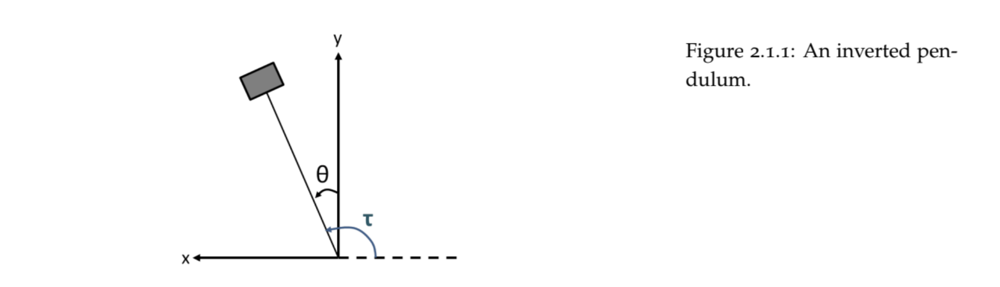

We can write down the equations of motion governing this system by thinking in terms of torques. Let $u$ denote the torque applied by a controller at the pendulum joint. We have

$$
\begin{align}
\tau_{net}
 &=  \tau_{gravity} + u\\
\tau_{net} &= mgl\sin\theta + u\\
ml^2 \ddot{\theta} &= mgl\sin\theta + u\\
\ddot{\theta} &= \frac{g}{l}\sin\theta + \frac{1}{ml^2}u\\
&\approx \frac{g}{l}\theta + \frac{1}{ml^2}u,
 \end{align}
$$

where we apply the [small-angle approximation](https://en.wikipedia.org/wiki/Small-angle_approximation) in the last step.

Great, we have the dynamics down! Now, let's linearize these equations of motion about the upright configuration of the system. Let $\boldsymbol x$ denote the vectorized state of the system, i.e. the pendulum's angle from upright as well as its velocity. Then,

$$
\begin{align}
\boldsymbol x_{t+1} &= \boldsymbol x_t + \Delta \boldsymbol x_t \\
&= \boldsymbol x_t + \dot{\boldsymbol x}_t \Delta t\\
\begin{bmatrix} \theta_{t+1} \\ \dot \theta_{t+1} \end{bmatrix} &= \begin{bmatrix} \theta_t \\ \dot \theta_t \end{bmatrix} + \begin{bmatrix}\dot{\theta}_t \Delta t \\ \ddot{\theta}_t\Delta t\end{bmatrix} \\&= \begin{bmatrix} \theta_t \\ \dot \theta_t \end{bmatrix} + \begin{bmatrix}\dot{\theta}_t \Delta t + \frac{1}{2} (\frac{g}{l}\sin\theta_t + \frac{1}{ml^2} u_t)(\Delta t)^2\\
(\frac{g}{l}\sin\theta_t + \frac{1}{ml^2} u_t)\Delta t\end{bmatrix}
\\
&\approx \begin{bmatrix} \theta_t \\ \dot \theta_t \end{bmatrix} + \begin{bmatrix}\dot{\theta}_t \Delta t + \frac{1}{2} (\frac{g}{l}\theta_t + \frac{1}{ml^2} u_t)(\Delta t)^2\\
(\frac{g}{l}\theta_t + \frac{1}{ml^2} u_t)\Delta t\end{bmatrix}
\end{align}
$$

Let's translate this to code.

In [1]:
import numpy as np
import autograd.numpy as np
from autograd import grad, jacobian
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib import rc
from IPython.display import HTML, Image
from matplotlib.patches import Circle
rc('animation', html='jshtml')

# set parameter values
g = 9.8
l = 1.0
m = 1.0

def inverted_pendulum_dynamics(x, u, delta_t=0.1, control_noise=None, dynamics_noise=None):
  # we want to model the possible effects of an imperfect controller
  if control_noise is not None:
    u = u + control_noise*np.random.randn(*u.shape) 

  theta_ddot = g/l * np.sin(x[0]) + (1/(m*l**2)) * u
  x_new = x + np.array([x[1]*delta_t + 0.5*theta_ddot[0]*delta_t**2, theta_ddot[0]*delta_t])

  # moreover, we also want to model the possible effects of "noisy" physics
  if dynamics_noise is not None:
    x_new = x_new + dynamics_noise*np.random.randn(*x_new.shape)

  return x_new

### Deriving the LQR matrices

In LQR, our goal is to identify a mapping from system states $\boldsymbol x$ and controls $u$ that minimizes some quadratic cost associated with a linearized system. 

For LQR, we want to separate all terms in the state $\boldsymbol x$ away from all terms in the control $\boldsymbol u$ to yield the form,
$$\boldsymbol x_{t+1} = A \boldsymbol x_t + Bu_t,$$
with our ultimate goal being to find a mapping from states to controls that minimizes the quadratic cost
$$c(\boldsymbol x, u) = \boldsymbol x^T Q x + u^T R u$$ of a (possibly time varying) system.

This leaves us with,

$$\begin{align} A &= \begin{bmatrix}1 + \frac{g}{2l} (\Delta t)^2  & \Delta t \\
\frac{g}{l} & 1\end{bmatrix}\\
B &= \begin{bmatrix}
\frac{1}{ml^2} (\Delta t)^2 \\
\frac{1}{ml^2} \Delta t
\end{bmatrix} \end{align}$$

Do these matrices remind you of anything? They reflect the jacobians of the dynamics with respect to $\boldsymbol x$ and $u$, respectively! Thus, we can once again leverage PyTorch's `jacobian` to automatically extract them from our previous definition of the dynamics.

In [2]:
# Dynamics matrices
dyn_x = jacobian(inverted_pendulum_dynamics, 0)
dyn_u = jacobian(inverted_pendulum_dynamics, 1)

x_ref = np.array([0., 0.])
u_ref = np.array([0.])
A = dyn_x(x_ref, u_ref)
B = dyn_u(x_ref, u_ref)

In this example, our goal is to balance the inverted pendulum upright by applying the least control possible, so our cost matrix $Q$ will be the identity, equally penalizing all states and velocities away from the upright, at-rest state of the pendulum. Our cost function will simply by $R = 1$.

In [3]:
# Cost function matrices
Q = np.array([[1, 0], [0, 1]])
R = 1*np.eye(1)

Let's write a bit of quick code implementing LQR value iteration. If you'd like to see a full derivation of these update equations, take a look at section 2.2 of [Modern Adaptive Control and Reinforcement Learning](https://drive.google.com/file/d/1SGMdtjpP8-Yxga2ph-tUWBcFx5cH89t2/view).

In [4]:
# Dynamic programming to compute K and V matrices backwards in time
def lqr_value_iteration(A, B, Q, R, H):
  V = Q 
  K = np.zeros((1,2)) 
  V_list = [V]
  K_list = [K]
  for t in range(H-2, -1, -1):
    K = -np.linalg.inv(R + B.T @ V @ B) @ (B.T @ V @ A)
    V = Q + K.T @ R @ K + np.transpose(A + B @ K) @ V @ (A + B @ K)
    V_list += [V]
    K_list += [K]
  return V_list, K_list

Now for some code to animate the values and policies.

In [5]:
# Function for creating an animation of values and policies
def animate_value(V_list, save_filename=None):
  value = lambda x, y, V: V[0,0] * x**2 + V[1,1] * y**2 + (V[0,1]+V[1,0]) * x * y
  x = np.linspace(-1, 1, 100)
  y = np.linspace(-1, 1, 100)
  X, Y = np.meshgrid(x, y)
  plt.style.use('dark_background')

  fig = plt.figure()
  plt.gca().set_aspect("equal")
  Z = value(X, Y, V_list[0])

  global cont # TODO: remove this global nonsense. 
  cont = plt.contourf(X, Y, Z, 20, cmap='YlOrRd')
  ttl = plt.text(-.25, 1.02, '')

  # animation function
  def animate(i):
      global cont
      Z = value(X, Y, V_list[i])
      for c in cont.collections:
          c.remove()  # removes only the contours, leaves the rest intact
      cont = plt.contourf(X, Y, Z, 20, cmap='YlOrRd')
      ttl.set_text(f'Time: {len(V_list)-i}')
      return cont

  anim = FuncAnimation(fig, animate, frames=len(V_list), blit=False, repeat=False)
  if save_filename is not None:
    anim.save(save_filename, writer = "pillow", fps=15)  
  return anim

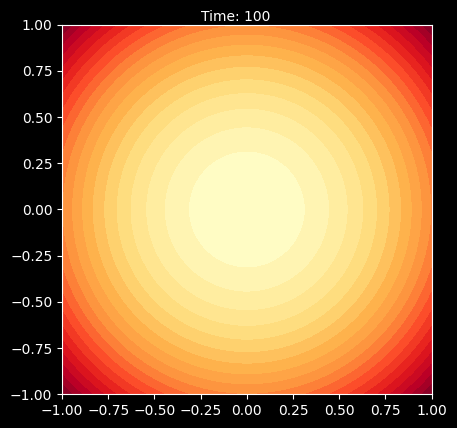

In [6]:
V_list, K_list = lqr_value_iteration(A, B, Q, R, H=100)
animate_value(V_list, save_filename='lqr_value_iteration.gif')

Below is some code that will allow us to look at what the inverted pendulum dynamics with LQR are like for arbitrary starting states.

In [7]:
def forward_simulate(x_0, K, H, control_noise=None, dynamics_noise=None):
  x_traj, u_traj = [], []
  x = x_0
  for t in range(H):
    u = K @ x
    x_traj.append(x)
    u_traj.append(u)
    x = inverted_pendulum_dynamics(x, u, control_noise=control_noise, dynamics_noise=dynamics_noise)
  return x_traj, u_traj

In [8]:
def animate_pendulum(x_traj, save_filename=None):
  plt.style.use('dark_background')
  fig = plt.figure()
  ax = fig.add_subplot(aspect='equal')
  plt.axis('off')
  x = x_traj[0]
  line, = ax.plot([0, x[0]], [0, x[1]], lw=3, c='w')
  bob_radius = 0.08
  circle = ax.add_patch(plt.Circle((x[0], x[1]), bob_radius, fc='tab:orange', zorder=3))
  ax.set_xlim(-l*0.8, l*0.8)
  ax.set_ylim(0.0, l*1.2)

  def draw_pendulum(i):
      """Update the animation at frame i."""
      x = x_traj[i]
      x, y = -l*np.sin(x[0]), l*np.cos(x[0])
      line.set_data([0, x], [0, y])
      circle.set_center((x, y))

  anim = FuncAnimation(fig, draw_pendulum, frames=100, blit=False, repeat=False)
  if save_filename is not None:
    anim.save(save_filename, writer='pillow', fps=15)
  return anim

In [9]:
def animate_phase_space(x_traj, V_f, save_filename=None):
  value = lambda x, y, V: V[0,0] * x**2 + V[1,1] * y**2 + (V[0,1]+V[1,0]) * x * y
  x = np.linspace(-1, 1, 100)
  y = np.linspace(-1, 1, 100)
  X, Y = np.meshgrid(x, y)
  plt.style.use('dark_background')
  fig = plt.figure()
  plt.gca().set_aspect("equal")
  Z = value(X, Y, V_f)
  plt.contourf(X, Y, Z, 20, cmap='YlOrRd')
  x = x_traj[0]
  point, = plt.plot([x[0]], [x[1]], '-k.', markersize=20)
  ttl = plt.text(-.25, 1.02, '')

  def draw_state_space(i):
      """Update the animation at frame i."""
      x = x_traj[i]
      point.set_data([x[0]], [x[1]])
      ttl.set_text('Time: {}'.format(i))

  anim = FuncAnimation(fig, draw_state_space, frames=100, blit=False, repeat=False)
  if save_filename is not None:
    anim.save(save_filename, writer='pillow', fps=15)
  return anim

### Easier Case: Falling Towards "Equilibrium"

First off, let's inspect a simpler starting position, where the pendulum starts off falling toward equilibrium.

/usr/local/lib/python3.9/dist-packages/numpy/core/shape_base.py:65: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  ary = asanyarray(ary)


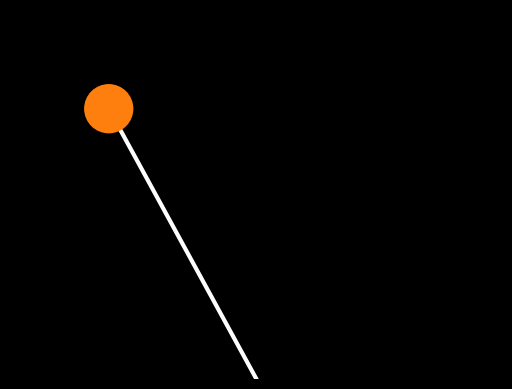

In [10]:
x_0 = np.array([[0.5], [-0.5]])
control_noise = 0.5
dyanmics_noise = np.array(([0.0], [0.05]))
x_traj, u_traj = forward_simulate(x_0, K_list[-1], H=100, control_noise = control_noise, dynamics_noise = dyanmics_noise)
animate_pendulum(x_traj, save_filename='easy_init_pendulum.gif')

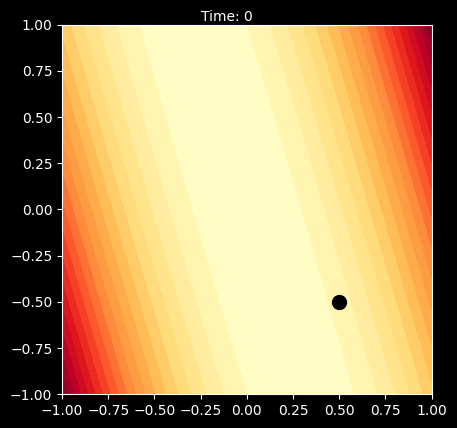

In [11]:
animate_phase_space(x_traj, V_list[-1], save_filename='easy_init_phase_space.gif')

### Harder Case: Falling Away from "Equilibrium"

Now what about the case in which the pendulum starts off falling *away* from equilibrium? We have...

/usr/local/lib/python3.9/dist-packages/numpy/core/shape_base.py:65: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  ary = asanyarray(ary)


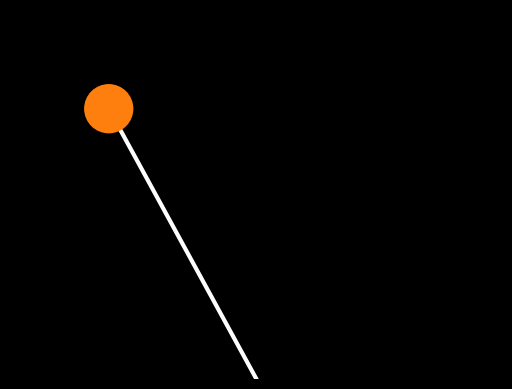

In [12]:
x_0 = np.array([[0.5], [0.5]])
control_noise = 0.5
dyanmics_noise = np.array(([0.0], [0.05]))
x_traj, u_traj = forward_simulate(x_0, K_list[-1], H=100, control_noise = control_noise, dynamics_noise = dyanmics_noise)
animate_pendulum(x_traj, save_filename='hard_init_pendulum.gif')

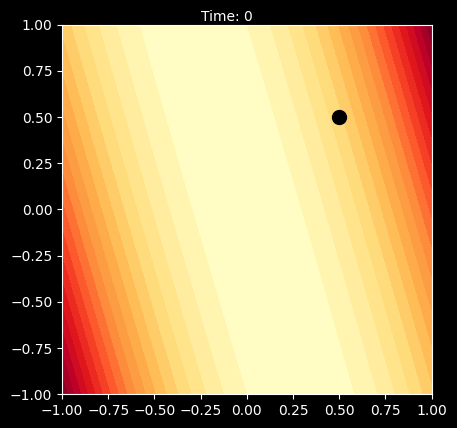

In [13]:
animate_phase_space(x_traj, V_list[-1], save_filename='hard_init_phase_space.gif')